# Evaluation Project 5: Census Income Project

# Problem Statement

# Census Income Project is a classification based problem statement to predict if the salray range is below 50k or above as well as equal to 50k, it also strives to study and generate as many insights as possible. The data consists of: Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income details of each individual.

# Importing Data From Github repository dsrscientist/dataset1/master/census_income.csv

# Importing Required Libraries And Data

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('census_income.csv',parse_dates=True)
data

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


# I have created a dataframe and stored it in variable data. This dataframe contains features and label to make predictions of salray of 32560 individuals.

In [20]:
data['Income'].unique()

array([' <=50K', ' >50K'], dtype=object)

# There are 2 unique values in label.

In [21]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  32560 Number Of Columns:  15


# Data Cleaning

In [22]:
data.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

# Checking column names to detect unnamed columns

In [23]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [24]:
data.isna().any()

Age               False
Workclass         False
Fnlwgt            False
Education         False
Education_num     False
Marital_status    False
Occupation        False
Relationship      False
Race              False
Sex               False
Capital_gain      False
Capital_loss      False
Hours_per_week    False
Native_country    False
Income            False
dtype: bool

In [25]:
data.isna().values.any()

False

In [26]:
data.isnull().values.sum()

0

In [27]:
data.dtypes, len(data.dtypes)

(Age                int64
 Workclass         object
 Fnlwgt             int64
 Education         object
 Education_num      int64
 Marital_status    object
 Occupation        object
 Relationship      object
 Race              object
 Sex               object
 Capital_gain       int64
 Capital_loss       int64
 Hours_per_week     int64
 Native_country    object
 Income            object
 dtype: object,
 15)

# Tabulated Conclusion Of Data Cleaning

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
1. The dataset has no missing values, therefore imputation and filling data are not required.
2. The whole dataset is of 32560*15, hence, chances of overfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 6 continuous columns and 9 categorical columns, hence, encoding is required.

# Dataset Visualization                                                                                                     

# Head View

In [29]:
data.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


# The above table represents first five rows of original dataset

# Sample View

In [30]:
data.sample()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
25851,36,Self-emp-not-inc,67728,Bachelors,13,Married-civ-spouse,Sales,Husband,White,Male,0,0,50,United-States,>50K


# The above table represents a random row as sample row from the dataset

# Tail View

In [31]:
data.tail()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
32559,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


<Figure size 21600x21600 with 0 Axes>

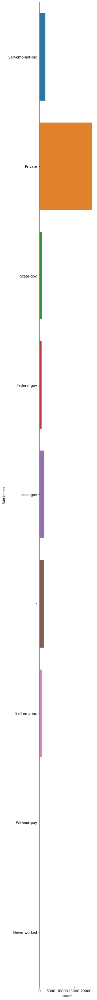

<Figure size 21600x21600 with 0 Axes>

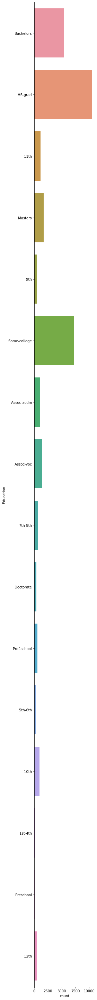

<Figure size 21600x21600 with 0 Axes>

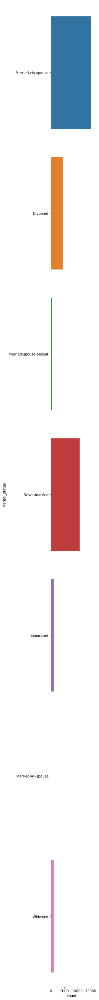

<Figure size 21600x21600 with 0 Axes>

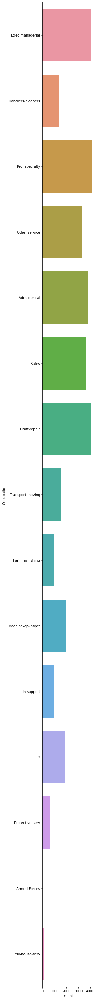

<Figure size 21600x21600 with 0 Axes>

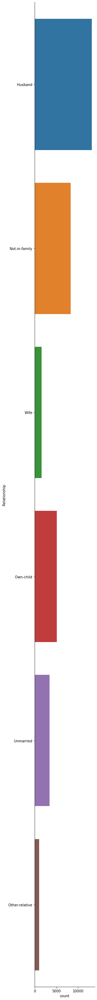

<Figure size 21600x21600 with 0 Axes>

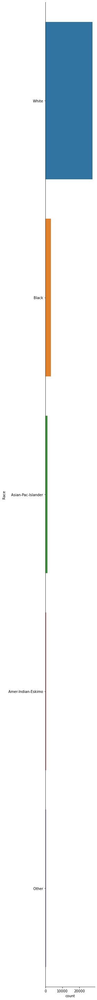

<Figure size 21600x21600 with 0 Axes>

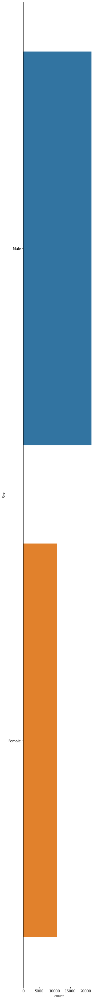

<Figure size 21600x21600 with 0 Axes>

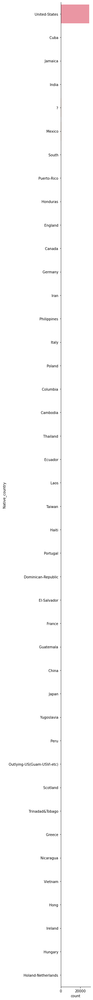

<Figure size 21600x21600 with 0 Axes>

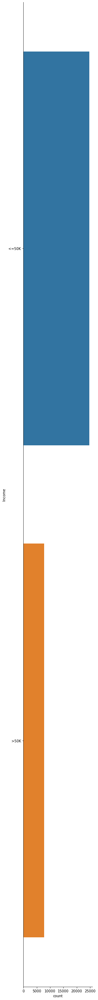

In [33]:
for x in data.select_dtypes(object).columns:
    plt.figure(figsize=(300,300))
    sns.catplot(y=x, kind='count', data=data, height=40, margin_titles=True, aspect=0.1)
    plt.show()

In [35]:
import plotly.express as px
import numpy
import plotly.graph_objects as go 
for x in range(len(axis_x)):
    fig = px.pie(data, names = axis_x[x])
    fig.show()

# The above table represents last five rows of the dataframe.

# Feature Engineering

# Encoding

In [12]:
data.select_dtypes(object).columns

Index(['Workclass', 'Education', 'Marital_status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Native_country', 'Income'],
      dtype='object')

# Encoding Of All Other Object Columns With Ordinal Encoder (9 such columns)

In [14]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,6.0,9.0,2.0,4.0,0.0,4.0,1.0,39.0,0.0
1,4.0,11.0,0.0,6.0,1.0,4.0,1.0,39.0,0.0
2,4.0,1.0,2.0,6.0,0.0,2.0,1.0,39.0,0.0
3,4.0,9.0,2.0,10.0,5.0,2.0,0.0,5.0,0.0
4,4.0,12.0,2.0,4.0,5.0,4.0,0.0,39.0,0.0
...,...,...,...,...,...,...,...,...,...
32555,4.0,7.0,2.0,13.0,5.0,4.0,0.0,39.0,0.0
32556,4.0,11.0,2.0,7.0,0.0,4.0,1.0,39.0,1.0
32557,4.0,11.0,6.0,1.0,4.0,4.0,0.0,39.0,0.0
32558,4.0,11.0,4.0,1.0,3.0,4.0,1.0,39.0,0.0


# Comparison Of Encoded Column And Original Column ('Business Travel')

In [15]:
encoded_data['Income_encoded'].unique()

array([0., 1.])

In [16]:
data['Income'].unique()

array([' <=50K', ' >50K'], dtype=object)

# Conclusion
Travel Rarely is encoded to 2, Travel frequently to 1 and Non Travel to 0.

# Concatenating Encoded Data With Original Data

In [17]:
data=pd.concat([data, encoded_data], axis=1, ignore_index=False)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50,83311,13,0,0,13,6.0,9.0,2.0,4.0,0.0,4.0,1.0,39.0,0.0
1,38,215646,9,0,0,40,4.0,11.0,0.0,6.0,1.0,4.0,1.0,39.0,0.0
2,53,234721,7,0,0,40,4.0,1.0,2.0,6.0,0.0,2.0,1.0,39.0,0.0
3,28,338409,13,0,0,40,4.0,9.0,2.0,10.0,5.0,2.0,0.0,5.0,0.0
4,37,284582,14,0,0,40,4.0,12.0,2.0,4.0,5.0,4.0,0.0,39.0,0.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [18]:
final_dataframe=data.copy()

In [19]:
final_dataframe.isna().values.any()

False

In [20]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

In [21]:
final_dataframe[np.isinf(final_dataframe)] = 0

# There are no null and missing values in final dataframe.

# EDA Part 1

In [22]:
final_dataframe[:10]

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50,83311,13,0,0,13,6.0,9.0,2.0,4.0,0.0,4.0,1.0,39.0,0.0
1,38,215646,9,0,0,40,4.0,11.0,0.0,6.0,1.0,4.0,1.0,39.0,0.0
2,53,234721,7,0,0,40,4.0,1.0,2.0,6.0,0.0,2.0,1.0,39.0,0.0
3,28,338409,13,0,0,40,4.0,9.0,2.0,10.0,5.0,2.0,0.0,5.0,0.0
4,37,284582,14,0,0,40,4.0,12.0,2.0,4.0,5.0,4.0,0.0,39.0,0.0
5,49,160187,5,0,0,16,4.0,6.0,3.0,8.0,1.0,2.0,0.0,23.0,0.0
6,52,209642,9,0,0,45,6.0,11.0,2.0,4.0,0.0,4.0,1.0,39.0,1.0
7,31,45781,14,14084,0,50,4.0,12.0,4.0,10.0,1.0,4.0,0.0,39.0,1.0
8,42,159449,13,5178,0,40,4.0,9.0,2.0,4.0,0.0,4.0,1.0,39.0,1.0
9,37,280464,10,0,0,80,4.0,15.0,2.0,4.0,0.0,2.0,1.0,39.0,1.0


# The above table represents first 10 rows from final dataframe.

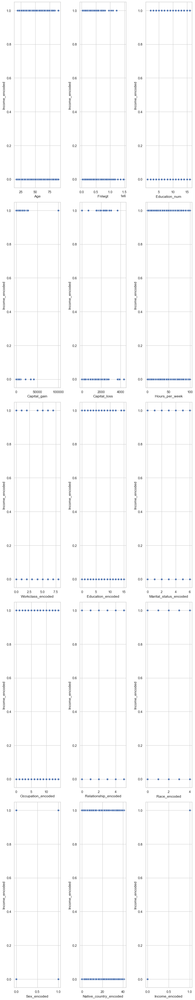

In [23]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(colist[x], y='Income_encoded', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that distribution is mostly evenly distributed for most of the columns. For example, 
i. Age

ii. Daily Rate

iii. Distance From Home

iv. Employee Number

v. Environment Satisfaction

vi. Horly Rate

vii. Job Involvement

viii. Job Level

ix. Job Satisfaction

x. Monthly Rate

xi. Number Of Companies Worked

Likewise, all the columns.

For example, 

1=Yes and 0=No

i. in years in current role, coordinate are evenly distributed between Attrition 0 and 1, except that 0 has a few extra points between 10 to 15 and beyond 15, depicting that people who have stayed in current role for more than 10 years have higher chance of attrition.

ii. people beyond 5 years since last promotion have higher chance of attrition.

iii. chances of attrition are high for total working years beyond 20.

iv. chances of attrition are high for total working years in current company beyond 20 years.

v. chance of attrition are high for people who are working with the current manager more than 10 years.

vi. Education field has equal number of yes and no.

vii. Chances of attrition are high for monthly income beyond 10000.

# Value Count Of employees vulnerable to attrition and not.

In [24]:
data['Income_encoded'].value_counts()

0.0    24719
1.0     7841
Name: Income_encoded, dtype: int64

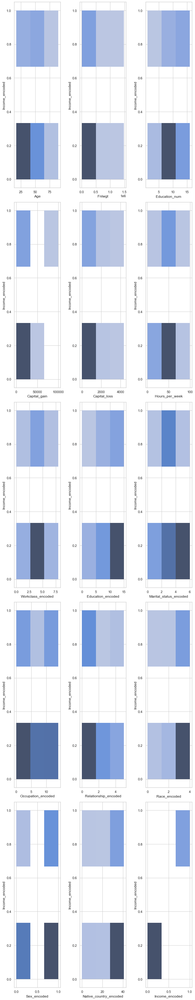

In [25]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='Income_encoded', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features agains label. It is divided into 3 bins. Only BusinessTravel shows left skewness. Many datapoints, WorkLifeBalance, JobInvolvement, Monthly Rate, etcetera seem to be close to normal with skewness threshold within +/-0.65.
3 columns have 0 skewness (as desired in normal distribution):

i. Employee Count,

ii. Standard Hours.

iii. Over 18 encoded.

In [26]:
final_dataframe.corr()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
Age,1.000000,-0.076646,0.036527,0.077674,0.057775,0.068756,0.003786,-0.010508,-0.266292,-0.020946,-0.263698,0.028718,0.088832,-0.001151,0.234039
Fnlwgt,-0.076646,1.000000,-0.043159,0.000437,-0.010259,-0.018770,-0.016587,-0.028156,0.028184,0.001554,0.008922,-0.021278,0.026882,-0.051957,-0.009481
Education_num,0.036527,-0.043159,1.000000,0.122627,0.079932,0.148127,0.052015,0.359172,-0.069338,0.109748,-0.094145,0.031825,0.012256,0.050831,0.335182
Capital_gain,0.077674,0.000437,0.122627,1.000000,-0.031614,0.078409,0.033828,0.030047,-0.043398,0.025511,-0.057918,0.011143,0.048477,-0.001984,0.223333
Capital_loss,0.057775,-0.010259,0.079932,-0.031614,1.000000,0.054256,0.012231,0.016744,-0.034182,0.017979,-0.061064,0.018902,0.045572,0.000420,0.150523
Hours_per_week,0.068756,-0.018770,0.148127,0.078409,0.054256,1.000000,0.138974,0.055510,-0.190521,0.080384,-0.248975,0.041910,0.229312,-0.002671,0.229690
Workclass_encoded,0.003786,-0.016587,0.052015,0.033828,0.012231,0.138974,1.000000,0.023537,-0.064798,0.255004,-0.090449,0.049720,0.095942,-0.007710,0.051645
Education_encoded,-0.010508,-0.028156,0.359172,0.030047,0.016744,0.055510,0.023537,1.000000,-0.038398,-0.021274,-0.010879,0.014135,-0.027349,0.064291,0.079311
Marital_status_encoded,-0.266292,0.028184,-0.069338,-0.043398,-0.034182,-0.190521,-0.064798,-0.038398,1.000000,-0.009617,0.185461,-0.068025,-0.129337,-0.023827,-0.199295
Occupation_encoded,-0.020946,0.001554,0.109748,0.025511,0.017979,0.080384,0.255004,-0.021274,-0.009617,1.000000,-0.075620,0.006779,0.080328,-0.012532,0.075448


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of Job Level and Age;  Marital Status Encoded and Stock Option Level; that show strong correlation between each other. Other  than these columns there seems modest collinearity among features. We will do further eda befor arriving at a conclusion to delete these columns.

# Graphical Representation Of Correlation Of Features With Label

In [27]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame((final_dataframe.corr()['Income_encoded'])).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with labe is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:

1. Highest correlation with labe is observed to be 16.21%, that is shared with marital status encoded. Minimum correlation is 0.3%, shared with Performance Rating.

2. Weak Positive To Strong Positive Relationship Is Found With Following Features:

i. BusinessTravel_encoded	7.377694602219632e-05 

ii. PerformanceRating	0.0028887517110809

iii.MonthlyRate	0.015170212530471473

iv. EducationField_encoded	0.026845545711446116

v.  Gender_encoded	0.029453253175141608

vi. NumCompaniesWorked	0.04349373905781363

vii.Department_encoded	0.06399059633809044

viii.JobRole_encoded	0.0671514950495707 

ix. DistanceFromHome	0.07792358295570369

x.  MaritalStatus_encoded	0.1620702346570145

xi. OverTime_encoded	0.24611799424580436

3. Weak Negative To Strong Negative Relationship Is Found With Following Features:

i.  TotalWorkingYears	-0.17106324613622612

ii. JobLevel	-0.16910475093102761

iii.YearsInCurrentRole	-0.16054500426770077

iv. MonthlyIncome	-0.15983958238498852

v.  Age	-0.15920500686577962

vi. YearsWithCurrManager	-0.1561993159016288

vii.StockOptionLevel	-0.13714491893332562

viii.YearsAtCompany	-0.13439221398997708

ix. JobInvolvement	-0.13001595678605374

x.  JobSatisfaction	-0.10348112606902123

xi. EnvironmentSatisfaction	-0.10336897833793603

xii.WorkLifeBalance	-0.06393904721740885

xiii. TrainingTimesLastYear	-0.05947779855642057

xiv.DailyRate	-0.05665199186762936

xv. RelationshipSatisfaction	-0.0458722788811267

xvi.YearsSinceLastPromotion	-0.033018775142584306

xvii.Education	-0.031372819640049315 

xviii. PercentSalaryHike	-0.01347820205743911 

xix.EmployeeNumber	-0.010577242759242786

xx. HourlyRate	-0.006845549572139952


4. Correlation Of Label with itself is of no relevance

5. No Correlqtion is found with:

i. EmployeeCount

ii. Standard Hours

iii. Over 18 Encoded

# Mathematical Notation:
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

# Correlation Heatmaps Of Individual Datasets

# Correlation Heatmap Of Original Dataset for 26 columns

<AxesSubplot:>

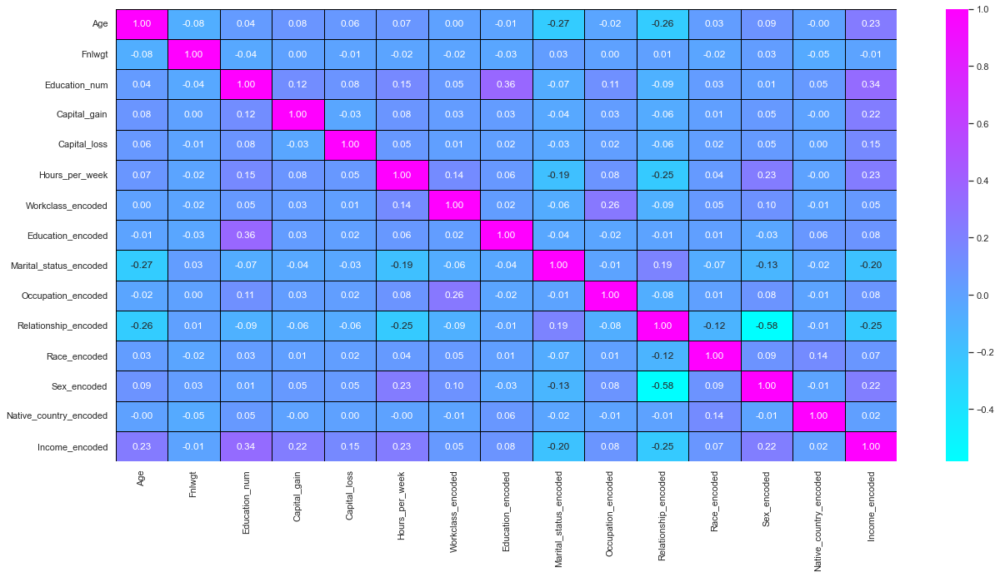

In [28]:
plt.figure(figsize=(21,10))
sns.heatmap(final_dataframe.corr().iloc[:,:27], annot=True, linewidths=0.5, linecolor='black', fmt='.2f', cmap='cool')

# Verbal Translation Of Above Graph:
1. Label has moderate negative relationship with 3 features:

i. Distance From Home

ii. Employee Number

iii. Job Satisfaction

iv. Training Times Last Year

v. Work Life Balance

2. Label has strong relationship with these features in this heatmap:

i. Job Level

ii. Monthly Income

iii. Total Working Years

3. Strong Multicollinearity is detected among 5 features:

i. Total Working Years

ii. Years At Company

iii. Years In Current Role

iv. Years Since Last Promotion

v. Years With Current Manager

4. Multicollinearity seems to be moderate among all other data points.

# Verbal Translation Of Above Graph:
    
1. There is high multicollinearity between Stock Option Level and Marital Status Encoded.

2. All other features display odest multicollinearity.

# Data Handling Conclusion Of Correlation

# Overall correlation among dataset. There seems some multicollinearity due to presence of Job Level and Age; Marital Status Encoded and Stock Option Level; that show strong correlation between each other. Other than these columns there seems modest collinearity among features. We will do further eda befor arriving at a conclusion to delete these columns.

The most useful feature is Business Travel, apart from this, there seems modest correlation of features with label.

As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:

i. Job Level and Age

ii. Marital Status Encoded and Stock Option Level

# Dataset Information Table

In [29]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     32560 non-null  int64  
 1   Fnlwgt                  32560 non-null  int64  
 2   Education_num           32560 non-null  int64  
 3   Capital_gain            32560 non-null  int64  
 4   Capital_loss            32560 non-null  int64  
 5   Hours_per_week          32560 non-null  int64  
 6   Workclass_encoded       32560 non-null  float64
 7   Education_encoded       32560 non-null  float64
 8   Marital_status_encoded  32560 non-null  float64
 9   Occupation_encoded      32560 non-null  float64
 10  Relationship_encoded    32560 non-null  float64
 11  Race_encoded            32560 non-null  float64
 12  Sex_encoded             32560 non-null  float64
 13  Native_country_encoded  32560 non-null  float64
 14  Income_encoded          32560 non-null

# The above table reprents information dataset:
    
i. Columns

ii. Count Of Non Null Data Points

iii. Values data type for each columns

iv. Count of data types in iii.

v. Memory Usage

It can be deduced that the dataset has 1470 rows and each columns has no missing values. The datatype used are float64, int32 and int64. There 8 float64 columns, 1 int 32 column and 26 int64 columns. Memory usage is 396.3 KB.

# Names of all the columns

In [30]:
data.select_dtypes(include = [np.number]).columns

Index(['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss',
       'Hours_per_week', 'Workclass_encoded', 'Education_encoded',
       'Marital_status_encoded', 'Occupation_encoded', 'Relationship_encoded',
       'Race_encoded', 'Sex_encoded', 'Native_country_encoded',
       'Income_encoded'],
      dtype='object')

# The above code cell highlights all numberic values, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [31]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
for x in colist:
    try:
        plot = px.violin(x=x, y=final_dataframe['Income_encoded'])
        plot.show()
    except ValueError:
        print('{0} vales out of range, try skewness function to detect outliers'.format(x))
        continue

Age vales out of range, try skewness function to detect outliers
Fnlwgt vales out of range, try skewness function to detect outliers
Education_num vales out of range, try skewness function to detect outliers
Capital_gain vales out of range, try skewness function to detect outliers
Capital_loss vales out of range, try skewness function to detect outliers
Hours_per_week vales out of range, try skewness function to detect outliers
Workclass_encoded vales out of range, try skewness function to detect outliers
Education_encoded vales out of range, try skewness function to detect outliers
Marital_status_encoded vales out of range, try skewness function to detect outliers
Occupation_encoded vales out of range, try skewness function to detect outliers
Relationship_encoded vales out of range, try skewness function to detect outliers
Race_encoded vales out of range, try skewness function to detect outliers
Sex_encoded vales out of range, try skewness function to detect outliers
Native_country_en

# Verbal Translation Of Above Graph
1. The data is mostly free of outliers.

2. A few outliers are detected in:

i. Hourly Rate

ii. Years At Company

iii. Education Field Encoded

# Data Handling Conclusion For Outliers

# Box plot does not extend to even upper quartile for most of the cases, Hence we will study skewness to arrive at final conclusion about multicollinearity and outliers detected.

# Descriptive Statistics

In [32]:
description=final_dataframe.describe()
description

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469,3.868796,10.298249,2.611794,6.572912,1.446376,3.665848,0.669195,36.718796,0.240817
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618,1.455879,3.870317,1.506225,4.228809,1.606794,0.848817,0.470510,7.823892,0.427586
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000,4.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,39.000000,0.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000,4.000000,11.000000,2.000000,7.000000,1.000000,4.000000,1.000000,39.000000,0.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000,4.000000,12.000000,4.000000,10.000000,3.000000,4.000000,1.000000,39.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,8.000000,15.000000,6.000000,14.000000,5.000000,4.000000,1.000000,41.000000,1.000000


In [33]:
lst=description.columns.to_list()
print(lst)

['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Workclass_encoded', 'Education_encoded', 'Marital_status_encoded', 'Occupation_encoded', 'Relationship_encoded', 'Race_encoded', 'Sex_encoded', 'Native_country_encoded', 'Income_encoded']


In [34]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[11.0], [58691.5], [2.0], [0.0], [0.0], [5.0], [0.0], [1.0], [2.0], [3.0], [2.0], [0.0], [0.0], [0.0], [0.0]]


(15, None)

In [35]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
IQR,11.0,58691.5,2.0,0.0,0.0,5.0,0.0,1.0,2.0,3.0,2.0,0.0,0.0,0.0,0.0


In [36]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[73.0], [1472420.0], [15.0], [99999.0], [4356.0], [98.0], [8.0], [15.0], [6.0], [14.0], [5.0], [4.0], [1.0], [41.0], [1.0]]


(15, None)

In [37]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
Range,73.0,1472420.0,15.0,99999.0,4356.0,98.0,8.0,15.0,6.0,14.0,5.0,4.0,1.0,41.0,1.0


In [38]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(               Age    Fnlwgt  Education_num  Capital_gain  Capital_loss  \
 Skewness  0.558738  1.446972       -0.31163      11.95369      4.594549   
 
           Hours_per_week  Workclass_encoded  Education_encoded  \
 Skewness        0.227636           -0.75228          -0.934063   
 
           Marital_status_encoded  Occupation_encoded  Relationship_encoded  \
 Skewness               -0.013448             0.11454              0.786784   
 
           Race_encoded  Sex_encoded  Native_country_encoded  Income_encoded  
 Skewness     -2.435332    -0.719244               -3.658235        1.212383  ,
                Age   Fnlwgt  Education_num  Capital_gain  Capital_loss  \
 Kurtosis -0.166212  6.21894       0.623525    154.795024     20.376029   
 
           Hours_per_week  Workclass_encoded  Education_encoded  \
 Kurtosis        2.916505           1.682718           0.680606   
 
           Marital_status_encoded  Occupation_encoded  Relationship_encoded  \
 Kurtosis               

# Outcome Table Of Descriptive Statistics

In [39]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469,3.868796,10.298249,2.611794,6.572912,1.446376,3.665848,0.669195,36.718796,0.240817
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618,1.455879,3.870317,1.506225,4.228809,1.606794,0.848817,0.470510,7.823892,0.427586
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000,4.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,39.000000,0.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000,4.000000,11.000000,2.000000,7.000000,1.000000,4.000000,1.000000,39.000000,0.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000,4.000000,12.000000,4.000000,10.000000,3.000000,4.000000,1.000000,39.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,8.000000,15.000000,6.000000,14.000000,5.000000,4.000000,1.000000,41.000000,1.000000
IQR,11.000000,5.869150e+04,2.000000,0.000000,0.000000,5.000000,0.000000,1.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000
Range,73.000000,1.472420e+06,15.000000,99999.000000,4356.000000,98.000000,8.000000,15.000000,6.000000,14.000000,5.000000,4.000000,1.000000,41.000000,1.000000


# Graphical Representation Of Above Table

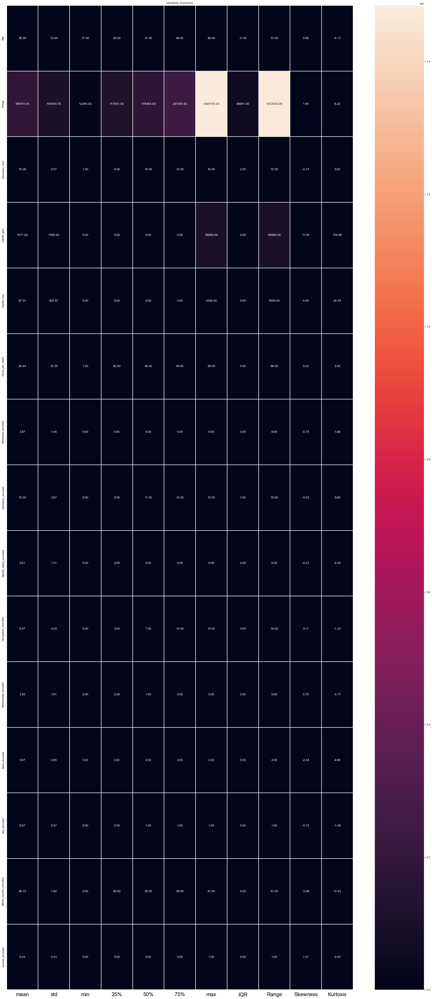

In [40]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, color='Black')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=10, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic
1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

2. The entire dataset ranges from 0 till 19999.

3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

4. Skewness is 0 and within +/- 0.65 for:

WorkLifeBalance

JobInvolvement

Gender_encoded

JobRole_encoded

JobSatisfaction

EnvironmentSatisfaction

RelationshipSatisfaction

Education

MaritalStatus_encoded

HourlyRate

DailyRate

EmployeeCount

StandardHours

Over18_encoded

EmployeeNumber

MonthlyRate

Department_encoded

Age

EducationField_encoded

TrainingTimesLastYear

5. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

6. Kutosis is upto 3 for most dataset, indicating platykurtic curves.

7. Kurtosis is greater than 3 obly for Years Since Last Promotion, indicating, leptokurtic curve.

8. Kurtosis for bell shaped curve should be 3.

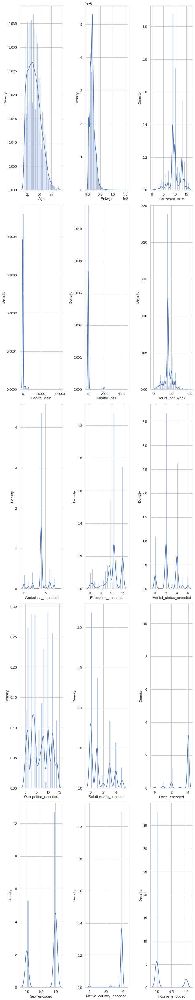

In [41]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations
1. Acceptable skewness is +/-0.65 and Right skewness for bell shaped curve is 0

2. Acceptable and Outliers Prone Left skewness is observed in:

BusinessTravel_encoded	-1.4390059727642035

WorkLifeBalance	-0.5524802990965146

JobInvolvement	-0.4984193640419493

Gender_encoded	-0.4086654142437622

JobRole_encoded	-0.3572699195636241

JobSatisfaction	-0.3296719586636647

EnvironmentSatisfaction	-0.32165444773937907

RelationshipSatisfaction	-0.30282756517072296

Education	-0.2896810819684331

MaritalStatus_encoded	-0.1521746207726309

HourlyRate	-0.03231095290044942

DailyRate	-0.003518568352325854

3. Acceptable And Outliers Prone Right Skewness is observed in:

EmployeeNumber	0.016574019580105036

MonthlyRate	0.018577807891132458

Department_encoded	0.1722308111183741

Age	0.4132863018563338

EducationField_encoded	0.5503712491120529

TrainingTimesLastYear	0.5531241710537028

PercentSalaryHike	0.8211279755780908

YearsWithCurrManager	0.8334509919918475

YearsInCurrentRole	0.9173631562908262

DistanceFromHome	0.9581179956568269

OverTime_encoded	0.9644888640425097

StockOptionLevel	0.9689803167738937

JobLevel	1.0254012829518246

NumCompaniesWorked	1.026471111968205

TotalWorkingYears	1.1171718528128527

MonthlyIncome	1.3698166808390662

YearsAtCompany	1.7645294543422085

Attrition	1.8443661240010911

PerformanceRating	1.921882702142603

YearsSinceLastPromotion	1.9842899833524859

4. Bell Shaped Curve (O skewness) is observed in:

EmployeeCount	0.0

StandardHours	0.0

Over18_encoded	0.0

# Conclusion:
Based On EDA done above in two parts, I am romving 2 columns, as part of Error Removal And Data Handling:

i. Hourly Rate


ii. Education Field Encoded


# Error Removal And Data Handling

# Based on above analysis, these columns have significant outliers, hence, are platykurtic, hence, I am removing these columns.


i. Hourly Rate

ii. Education Field Encoded

In [42]:
final_dataframe.kurtosis().sort_values(ascending=False)

Capital_gain              154.795024
Capital_loss               20.376029
Native_country_encoded     12.532526
Fnlwgt                      6.218940
Race_encoded                4.876025
Hours_per_week              2.916505
Workclass_encoded           1.682718
Education_encoded           0.680606
Education_num               0.623525
Age                        -0.166212
Income_encoded             -0.530160
Marital_status_encoded     -0.536051
Relationship_encoded       -0.768443
Occupation_encoded         -1.234698
Sex_encoded                -1.482779
dtype: float64

In [43]:
final_dataframe=final_dataframe.drop(['Capital_gain', 'Capital_loss', 'Native_country_encoded'], axis=1)
final_dataframe

,Age,Fnlwgt,Education_num,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Income_encoded
0,50,83311,13,13,6.0,9.0,2.0,4.0,0.0,4.0,1.0,0.0
1,38,215646,9,40,4.0,11.0,0.0,6.0,1.0,4.0,1.0,0.0
2,53,234721,7,40,4.0,1.0,2.0,6.0,0.0,2.0,1.0,0.0
3,28,338409,13,40,4.0,9.0,2.0,10.0,5.0,2.0,0.0,0.0
4,37,284582,14,40,4.0,12.0,2.0,4.0,5.0,4.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,257302,12,38,4.0,7.0,2.0,13.0,5.0,4.0,0.0,0.0
32556,40,154374,9,40,4.0,11.0,2.0,7.0,0.0,4.0,1.0,1.0
32557,58,151910,9,40,4.0,11.0,6.0,1.0,4.0,4.0,0.0,0.0
32558,22,201490,9,20,4.0,11.0,4.0,1.0,3.0,4.0,1.0,0.0


# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

# Z Score: Outliers Treatment

In [24]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
final_dataframe[np.isinf(final_dataframe)] = 0
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(method='ffill')
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(32560, 15)

In [25]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([    3,     9,    10, ..., 32532, 32550, 32552], dtype=int64), array([13,  5, 11, ..., 11, 11, 11], dtype=int64))


# The cell above displays outlier values.

In [26]:
len(np.where(score>3)[0])

5667

# The cell above shows number of outliers.

In [27]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50,83311,13,0,0,13,6.0,9.0,2.0,4.0,0.0,4.0,1.0,39.0,0.0
1,38,215646,9,0,0,40,4.0,11.0,0.0,6.0,1.0,4.0,1.0,39.0,0.0
2,53,234721,7,0,0,40,4.0,1.0,2.0,6.0,0.0,2.0,1.0,39.0,0.0
4,37,284582,14,0,0,40,4.0,12.0,2.0,4.0,5.0,4.0,0.0,39.0,0.0
5,49,160187,5,0,0,16,4.0,6.0,3.0,8.0,1.0,2.0,0.0,23.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,257302,12,0,0,38,4.0,7.0,2.0,13.0,5.0,4.0,0.0,39.0,0.0
32556,40,154374,9,0,0,40,4.0,11.0,2.0,7.0,0.0,4.0,1.0,39.0,1.0
32557,58,151910,9,0,0,40,4.0,11.0,6.0,1.0,4.0,4.0,0.0,39.0,0.0
32558,22,201490,9,0,0,20,4.0,11.0,4.0,1.0,3.0,4.0,1.0,39.0,0.0


# The table above shows the final dataframe after removing outliers, 8 rows are removed and resultant dimension is 0 rows * 33 columns

# IQR Method Of Outliers Removal

# Since, all the rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [28]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [29]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,NaN,NaN,NaN,NaN,NaN,13.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,5.0,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
32557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32558,NaN,NaN,NaN,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [30]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [31]:
new_df=new_df.fillna(method='bfill')
new_df

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50.0,83311.0,13.0,NaN,NaN,40.0,NaN,9.0,2.0,4.0,0.0,NaN,1.0,NaN,NaN
1,38.0,215646.0,9.0,NaN,NaN,40.0,NaN,11.0,0.0,6.0,1.0,NaN,1.0,NaN,NaN
2,53.0,234721.0,7.0,NaN,NaN,40.0,NaN,9.0,2.0,6.0,0.0,NaN,1.0,NaN,NaN
3,28.0,338409.0,13.0,NaN,NaN,40.0,NaN,9.0,2.0,10.0,5.0,NaN,0.0,NaN,NaN
4,37.0,284582.0,14.0,NaN,NaN,40.0,NaN,12.0,2.0,4.0,5.0,NaN,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27.0,257302.0,12.0,NaN,NaN,38.0,NaN,7.0,2.0,13.0,5.0,NaN,0.0,NaN,NaN
32556,40.0,154374.0,9.0,NaN,NaN,40.0,NaN,11.0,2.0,7.0,0.0,NaN,1.0,NaN,NaN
32557,58.0,151910.0,9.0,NaN,NaN,40.0,NaN,11.0,6.0,1.0,4.0,NaN,0.0,NaN,NaN
32558,22.0,201490.0,9.0,NaN,NaN,40.0,NaN,11.0,4.0,1.0,3.0,NaN,1.0,NaN,NaN


# The above table displays the final dataframe after IQR  treatment, since this method restores all the rows. It signifies that outliers are not very much spread and can be treated with power transform method.

# I prefer IQR+ Power Transform in this case because outliers are not very significant

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

Label vector is Attrition.

In [32]:
x=final_dataframe.drop(['Income_encoded'], axis=1)
y=final_dataframe['Income_encoded']
x.sample()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded
2303,45,246891,13,0,1902,40,4.0,9.0,2.0,12.0,0.0,4.0,1.0,39.0


# The above table displays a sample of features vector.

In [33]:
y.sample()

10162    0.0
Name: Income_encoded, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [34]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded
0,0.891947,-1.089889,1.164793,-0.301370,-0.221213,-2.221515,1.644223,-0.477012,-0.383427,-0.502825,-1.094635,0.412893,0.703087,0.329074
1,0.102717,0.398743,-0.464330,-0.301370,-0.221213,-0.035570,0.011864,0.090482,-1.782434,-0.013085,0.134511,0.412893,0.703087,0.329074
2,1.064381,0.562540,-1.200274,-0.301370,-0.221213,-0.035570,0.011864,-2.067600,-0.383427,-0.013085,-1.094635,-2.431920,0.703087,0.329074
3,-0.731663,1.340398,1.164793,-0.301370,-0.221213,-0.035570,0.011864,-0.477012,-0.383427,0.829763,1.549018,-2.431920,-1.422298,-3.224844
4,0.028023,0.957182,1.600809,-0.301370,-0.221213,-0.035570,0.011864,0.395133,-0.383427,-0.502825,1.549018,0.412893,-1.422298,0.329074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,-0.827983,0.746749,0.739697,-0.301370,-0.221213,-0.197550,0.011864,-0.984718,-0.383427,1.386870,1.549018,0.412893,-1.422298,0.329074
32556,0.247374,-0.193298,-0.464330,-0.301370,-0.221213,-0.035570,0.011864,0.090482,-0.383427,0.211660,-1.094635,0.412893,0.703087,0.329074
32557,1.334556,-0.219755,-0.464330,-0.301370,-0.221213,-0.035570,0.011864,0.090482,2.171784,-1.415274,1.351388,0.412893,-1.422298,0.329074
32558,-1.358341,0.271668,-0.464330,-0.301370,-0.221213,-1.654992,0.011864,0.090482,0.919719,-1.415274,1.091081,0.412893,0.703087,0.329074


# The above table displays outliers transformed values as discussed above.

In [35]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [36]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,1])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[0.61358554, 0.1902895 , 0.75522412, ..., 1.        , 1.        ,
        0.72616604],
       [0.44596256, 0.35933948, 0.45740273, ..., 1.        , 1.        ,
        0.72616604],
       [0.65020854, 0.37794043, 0.32286398, ..., 0.00562546, 1.        ,
        0.72616604],
       ...,
       [0.70759057, 0.28910252, 0.45740273, ..., 1.        , 0.        ,
        0.72616604],
       [0.13565086, 0.34490879, 0.45740273, ..., 1.        , 1.        ,
        0.72616604],
       [0.63819631, 0.42559328, 0.45740273, ..., 1.        , 0.        ,
        0.72616604]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 10 to 1000 because that can be fitted as a good match with intercept to make big numeric prediction. Also, these values are more alike the label vector, hence, model performance can be sound.

In [37]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [38]:
x_frame1.values.max()

1.0

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

In [39]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
5,11.170632,Hours_per_week
2,10.776830,Education_num
13,10.549902,Native_country_encoded
1,7.473595,Fnlwgt
11,6.887398,Race_encoded
6,6.469716,Workclass_encoded
7,6.028851,Education_encoded
0,5.179939,Age
9,4.703379,Occupation_encoded
12,4.533345,Sex_encoded


In [40]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
5,11.170632,Hours_per_week
2,10.776830,Education_num
13,10.549902,Native_country_encoded
1,7.473595,Fnlwgt
11,6.887398,Race_encoded
6,6.469716,Workclass_encoded
7,6.028851,Education_encoded


In [44]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['Hours_per_week', 'Education_num', 'Native_country_encoded', 'Fnlwgt', 'Workclass_encoded'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
7,5.848681,Race_encoded
3,4.858765,Education_encoded
0,4.214450,Age
4,4.104634,Marital_status_encoded
5,3.971827,Occupation_encoded
8,3.856546,Sex_encoded
6,2.967551,Relationship_encoded
1,1.120493,Capital_gain
2,1.061981,Capital_loss


# Since, all the vif scores are below 6, I can pass the listed features for feature selection.

# Data Handling Conclusion

# Concluding Points:
1. As part of data handling, I have removed features with high outliers (by analyzing box plots, dist plots, variable plot and scatter plots).                            

2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.                                                                  
3. Hence, the model can be expected to be low bias model.

# Feature Selection

In [45]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [46]:
x.shape, y.shape

((32560, 14), (32560,))

In [47]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train with randomness value as 100.

In [48]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those. To ensure low variance, I have taken variance threshold of 0.01.

<AxesSubplot:>

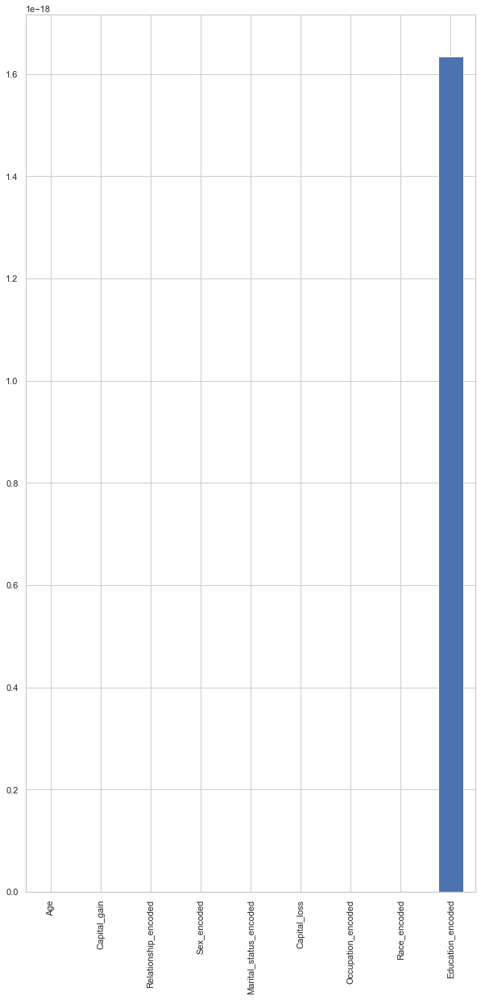

In [49]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [50]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['Age', 'Capital_gain', 'Relationship_encoded', 'Sex_encoded',
       'Marital_status_encoded', 'Capital_loss', 'Occupation_encoded',
       'Race_encoded', 'Education_encoded'],
      dtype='object')

# These features strongly impact attrition and control actions are required mainly on these to curb the problems around attrition.

# P Values are an important component of feature selection, with significance level set to 0.05, Variance Threshold
    ensemble technique returns with 95% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.05 are:
Index(['AveragePrice', '4046'], dtype='object')

In [51]:
import numpy as np
x=x_frame1.copy()
x=x[['Age', 'Capital_gain', 'Relationship_encoded', 'Sex_encoded',
       'Marital_status_encoded', 'Capital_loss', 'Occupation_encoded',
       'Race_encoded', 'Education_encoded']]
x.sample()

,Age,Capital_gain,Relationship_encoded,Sex_encoded,Marital_status_encoded,Capital_loss,Occupation_encoded,Race_encoded,Education_encoded
12687,0.430098,0.999995,0.0,1.0,0.353801,0.0,0.122346,1.0,0.400924


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [52]:
y.sample()

29102    1.0
Name: Income_encoded, dtype: float64

# The above series displays a sample of label.

In [53]:
x.shape, y.shape

((32560, 9), (32560,))

# The above cell displays final shapes of x and y vectors

In [54]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [55]:
x_train.shape, y_train.shape

((13024, 9), (13024,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Total Models = 10)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven label points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve a goodness of fit. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low). 

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is support vector classifier and hence, is again a very powerful implementation to prevent illness of fit and make appropriate decision boundaries.

# Model 1

# Random Forest Classifier With Intuitional Hyper Parameter Tuning

In [56]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [57]:
model1_prediction_train

,y_train,yhat
27987,1.0,0.0
22844,1.0,0.0
8203,0.0,0.0
32108,1.0,0.0
26989,0.0,0.0
...,...,...
24590,0.0,0.0
10723,0.0,0.0
27185,0.0,0.0
4532,1.0,0.0


In [58]:
model1_prediction_test

,y_test,yhat
29314,0.0,0.0
7099,1.0,0.0
14774,0.0,0.0
10939,0.0,0.0
18087,0.0,0.0
...,...,...
24249,1.0,0.0
20030,0.0,0.0
24096,0.0,0.0
20412,0.0,0.0


In [59]:
# Model 1 Metrics

In [60]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))
#Since risk is low model is low variance and since train score and test score are equivalent, model is low bias too.

Train Score:  0.76
Test Score:  0.76
Train Accuracy Score:  0.76
Test Accuracy Score:  0.76
Cross Validation Score:  0.76
Cross Validation Risk:  0.0


In [61]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

         0.0       0.76      1.00      0.86     14789
         1.0       0.00      0.00      0.00      4747

    accuracy                           0.76     19536
   macro avg       0.38      0.50      0.43     19536
weighted avg       0.57      0.76      0.65     19536



In [62]:
print(confusion_matrix(y_test,ytst_pred))

[[14789     0]
 [ 4747     0]]


In [63]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print(auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

0.5


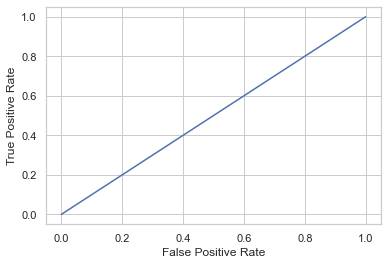

In [64]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


# Model 2

# Random Forest Classifier With Default Hyper Parameter Tuning

In [65]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [66]:
model2_prediction_train

,y_train,yhat
27987,1.0,1.0
22844,1.0,1.0
8203,0.0,0.0
32108,1.0,1.0
26989,0.0,0.0
...,...,...
24590,0.0,0.0
10723,0.0,0.0
27185,0.0,0.0
4532,1.0,1.0


In [67]:
model2_prediction_test

,y_test,yhat
29314,0.0,0.0
7099,1.0,1.0
14774,0.0,0.0
10939,0.0,0.0
18087,0.0,0.0
...,...,...
24249,1.0,1.0
20030,0.0,0.0
24096,0.0,0.0
20412,0.0,0.0


In [68]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  0.94
Test Score:  0.83
Train Accuracy Score:  0.94
Test Accuracy Score:  0.83
Cross Validation Score:  0.84
Cross Validation Risk:  0.0


In [69]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89     14789
         1.0       0.68      0.60      0.63      4747

    accuracy                           0.83     19536
   macro avg       0.78      0.75      0.76     19536
weighted avg       0.83      0.83      0.83     19536



In [70]:
print(confusion_matrix(y_test, ytst_pred1))

[[13441  1348]
 [ 1915  2832]]


In [71]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.75


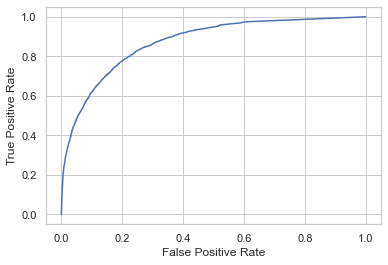

In [72]:
from sklearn import metrics
y_pred_proba =rfc1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 3

# RFC With Grid Search CV

In [73]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [74]:
# Model 3 Predictions

In [75]:
model3_prediction_train

,y_train,yhat
27987,1.0,1.0
22844,1.0,1.0
8203,0.0,0.0
32108,1.0,1.0
26989,0.0,0.0
...,...,...
24590,0.0,0.0
10723,0.0,0.0
27185,0.0,0.0
4532,1.0,1.0


In [76]:
model3_prediction_test

,y_test,yhat
29314,0.0,0.0
7099,1.0,1.0
14774,0.0,0.0
10939,0.0,0.0
18087,0.0,0.0
...,...,...
24249,1.0,1.0
20030,0.0,0.0
24096,0.0,0.0
20412,0.0,0.0


In [77]:
# Model 3 Metrics

In [78]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  0.94
Test Score:  0.83
Train Accuracy Score:  0.94
Test Accuracy Score:  0.83


In [79]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'gini', 'max_features': 'sqrt', 'n_estimators': 100, 'n_jobs': -1, 'oob_score': False, 'warm_start': False}
0.8390667244546262


In [80]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(max_features='sqrt', n_jobs=-1)


In [81]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89     14789
         1.0       0.68      0.60      0.64      4747

    accuracy                           0.83     19536
   macro avg       0.78      0.75      0.76     19536
weighted avg       0.83      0.83      0.83     19536

[[13422  1367]
 [ 1891  2856]]


In [82]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.75


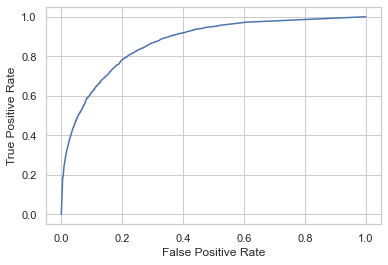

In [83]:
from sklearn import metrics
y_pred_proba =best_estim.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 4

# Bagging Classifier With Grid Search CV Hyper Parameter Tuning

In [84]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [85]:
# Model 4 Predictions

In [88]:
model4_prediction_train

,y_train,yhat
27987,1.0,1.0
22844,1.0,1.0
8203,0.0,0.0
32108,1.0,1.0
26989,0.0,0.0
...,...,...
24590,0.0,0.0
10723,0.0,0.0
27185,0.0,0.0
4532,1.0,1.0


In [89]:
model4_prediction_test

,y_test,yhat
29314,0.0,0.0
7099,1.0,1.0
14774,0.0,0.0
10939,0.0,0.0
18087,0.0,1.0
...,...,...
24249,1.0,1.0
20030,0.0,0.0
24096,0.0,0.0
20412,0.0,0.0


In [90]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  0.94
Test Score:  0.83
Train Accuracy Score:  0.94
Test Accuracy Score:  0.83


In [91]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 10}
0.8320032078214235


In [92]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=10)


In [93]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.88      0.90      0.89     14789
         1.0       0.67      0.60      0.63      4747

    accuracy                           0.83     19536
   macro avg       0.77      0.75      0.76     19536
weighted avg       0.82      0.83      0.83     19536



In [94]:
print(confusion_matrix(y_test, ytst_pred3))

[[13368  1421]
 [ 1905  2842]]


In [95]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.75


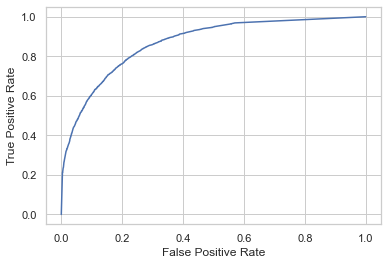

In [96]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model5

# Decision Tree Regressor With Default Hyper Parameter Tuning

In [97]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [98]:
y_pred5=pd.DataFrame(clf.predict(x_train), columns=['yhat'])
print('Train Prediction\n')
y_pred5

Train Prediction



,yhat
0,0.0
1,0.0
2,1.0
3,1.0
4,1.0
...,...
13019,1.0
13020,0.0
13021,0.0
13022,0.0


In [99]:
ytst_pred5=pd.DataFrame(clf.predict(x_test), columns=['yhat'])
print('Test Prediction\n')
ytst_pred5

Test Prediction



,yhat
0,0.0
1,1.0
2,1.0
3,0.0
4,0.0
...,...
19531,0.0
19532,0.0
19533,0.0
19534,0.0


In [100]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.61
Test Score:  0.61
Train Accuracy Score:  0.61
Test Accuracy Score:  0.61
Cross Validation Score:  0.76
Cross Validation Risk:  0.0


In [101]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.74      0.75      0.74     14789
         1.0       0.19      0.18      0.18      4747

    accuracy                           0.61     19536
   macro avg       0.46      0.46      0.46     19536
weighted avg       0.60      0.61      0.61     19536



In [102]:
print(confusion_matrix(y_test, ytst_pred5))

[[11077  3712]
 [ 3901   846]]


In [103]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred5), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.46


In [104]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is off for model development.')

Graph cannot be generated because probability is off for model development.


# Resampling, Rescaling And Re Feature Selection And Re Spliting For Model Optimization

# Reasoning Of Applying Resampling and developing models 6 to 10.

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.
Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# Since, original y vector is highly unsampled, I will do resampling to balance both 1 and 0 data points to ensure that alongwith being low on variance, the model is also low on bias. Hence, I I can achieve, bias variance trade off.

# Hence, I have developed models 6 to 10 based on rfc, ensemble and svm methods on resampled data

In [105]:
y.value_counts() #original y vector, value counts

0.0    24719
1.0     7841
Name: Income_encoded, dtype: int64

0.0    22255
1.0    22255
Name: Income_encoded, dtype: int64


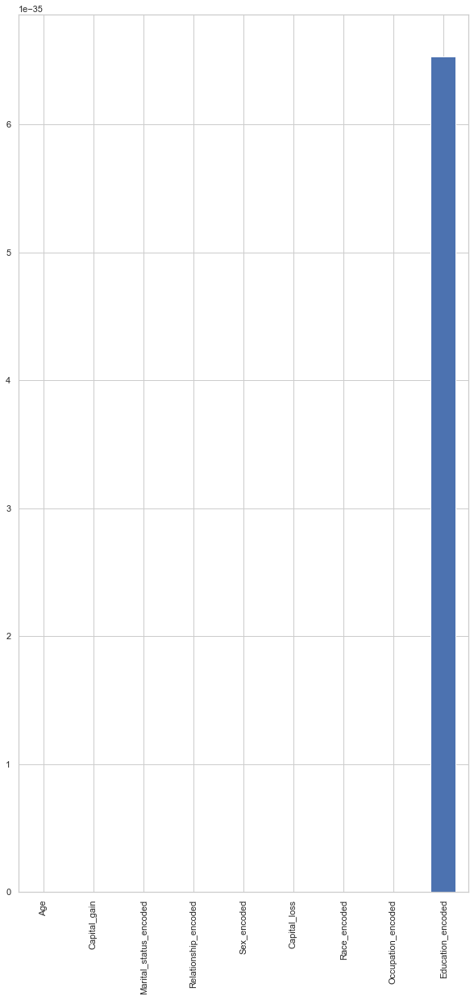

In [176]:
import numpy as np
from sklearn.utils import resample
x=x_frame11.copy()
y=final_dataframe['Income_encoded']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)
X=pd.concat([x_train, y_train], axis=1)
not_good=X[X['Income_encoded']==0]
good=X[X['Income_encoded']==1]
good_upsampled=resample(good, replace=True, n_samples=len(not_good), random_state=0)
upsampled=pd.concat([not_good, good_upsampled])
x=upsampled.drop('Income_encoded', axis=1)
y=upsampled['Income_encoded']
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x,y,test_size=0.3)
print(upsampled['Income_encoded'].value_counts())
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))
p_values=p_values[p_values<0.05]
p_values=pd.DataFrame(p_values, columns=['P Values'])
p_values['Features']=p_values.index
p_values=p_values[['Features', 'P Values']]
if len(p_values.index) != 0:
    x=x[p_values['Features']]
else:
    x=upsampled.drop('Income_encoded', axis=1)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)

# The above matrix represent balanced label vector with 1105 data points for 0 and 1105 data points for 1. And the graph shoows new set of strong indicators based on p values, with variance threshold as low as 0.01 and comfidence as 95%.

In [177]:
p_values

,Features,P Values
Age,Age,0.000000e+00
Capital_gain,Capital_gain,0.000000e+00
Marital_status_encoded,Marital_status_encoded,0.000000e+00
Relationship_encoded,Relationship_encoded,0.000000e+00
Sex_encoded,Sex_encoded,0.000000e+00
Capital_loss,Capital_loss,1.637329e-138
Race_encoded,Race_encoded,3.658487e-85
Occupation_encoded,Occupation_encoded,3.704169e-58
Education_encoded,Education_encoded,6.531377e-35


In [178]:
x_train.sample()

,Age,Capital_gain,Marital_status_encoded,Relationship_encoded,Sex_encoded,Capital_loss,Race_encoded,Occupation_encoded,Education_encoded
23671,0.491575,0.0,0.353801,0.0,1.0,1.0,1.0,0.784079,0.47467


In [179]:
y_train.sample()

6735    0.0
Name: Income_encoded, dtype: float64

# Model 6

# RFC On Resampled Data With Intuitional Hyper Parameter Tuning

In [180]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [181]:
model1_prediction_train

,y_train,yhat
1394,1.0,1.0
727,0.0,1.0
25306,0.0,1.0
15226,0.0,1.0
15569,0.0,1.0
...,...,...
2015,0.0,1.0
13064,1.0,1.0
5050,1.0,1.0
18000,1.0,1.0


In [182]:
model1_prediction_test

,y_test,yhat
24517,0.0,1.0
14626,0.0,1.0
30765,1.0,1.0
13959,1.0,1.0
11818,0.0,1.0
...,...,...
24863,1.0,1.0
21550,1.0,1.0
25703,0.0,1.0
1811,1.0,1.0


In [183]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.5
Test Score:  0.49
Train Accuracy Score:  0.5
Test Accuracy Score:  0.49
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [184]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred))
print(confusion_matrix(y_test, ytst_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      2249
         1.0       0.49      1.00      0.66      2202

    accuracy                           0.49      4451
   macro avg       0.25      0.50      0.33      4451
weighted avg       0.24      0.49      0.33      4451

[[   0 2249]
 [   0 2202]]


In [185]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.5


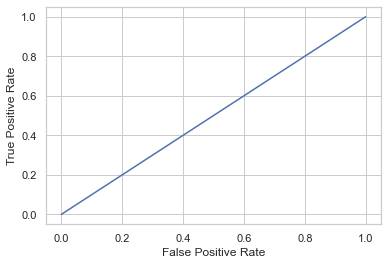

In [186]:
from sklearn import metrics
try:
    y_pred_proba =rfc.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model 7

# RFC On Resampled Data With Default Hyper Parameter Tuning

In [187]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [188]:
y_pred1

array([1., 0., 0., ..., 1., 1., 1.])

In [189]:
ytst_pred1

array([0., 0., 0., ..., 0., 1., 1.])

In [190]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  0.93
Test Score:  0.89
Train Accuracy Score:  0.93
Test Accuracy Score:  0.89
Cross Validation Score:  0.89
Cross Validation Risk:  0.01


In [191]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.89


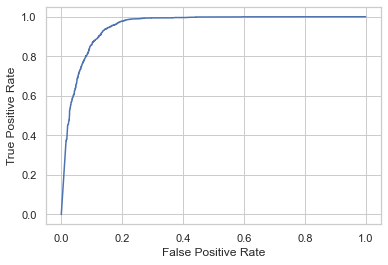

In [192]:
from sklearn import metrics
try:
    y_pred_proba =rfc1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model8

# RFC With Grid Search CV On Resampled Data

In [193]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2}) # Model 8 train prediction
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2}) # Model 8 test prediction

In [194]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  0.93
Test Score:  0.89
Train Accuracy Score:  0.93
Test Accuracy Score:  0.89


In [195]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'gini', 'max_features': 'log2', 'n_estimators': 100, 'n_jobs': -1, 'oob_score': True, 'warm_start': True}
0.8825732160715362


In [196]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(max_features='log2', n_jobs=-1, oob_score=True,
                       warm_start=True)


In [197]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.94      0.84      0.89      2249
         1.0       0.85      0.95      0.90      2202

    accuracy                           0.89      4451
   macro avg       0.90      0.89      0.89      4451
weighted avg       0.90      0.89      0.89      4451

[[1893  356]
 [ 120 2082]]


In [198]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.89


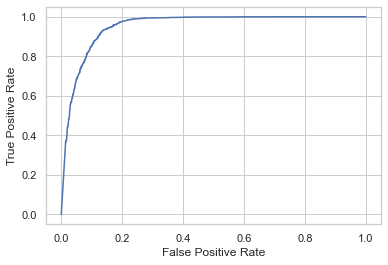

In [199]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

In [200]:
best_model1=pickle.dumps(best_estim) #saving the model

# Model 9

# Bagging Classifier With Grid Searh CV Hyper Parameter Tuning On Resampled Data

In [202]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)

model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [203]:
model4_prediction_train

,y_train,yhat
1394,1.0,1.0
727,0.0,0.0
25306,0.0,0.0
15226,0.0,0.0
15569,0.0,0.0
...,...,...
2015,0.0,0.0
13064,1.0,1.0
5050,1.0,1.0
18000,1.0,1.0


In [204]:
model4_prediction_test

,y_test,yhat
24517,0.0,0.0
14626,0.0,0.0
30765,1.0,0.0
13959,1.0,1.0
11818,0.0,0.0
...,...,...
24863,1.0,1.0
21550,1.0,1.0
25703,0.0,0.0
1811,1.0,1.0


In [205]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  0.93
Test Score:  0.89
Train Accuracy Score:  0.93
Test Accuracy Score:  0.89


In [206]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 1000}
0.8786041353647971


In [207]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=1000)


In [208]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError as err:
    print(err)

auc:  0.89


In [209]:
y_train.unique()

array([1., 0.])

In [210]:
y_test.unique()

array([0., 1.])

In [211]:
y.unique()

array([0., 1.])

In [212]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))
print(confusion_matrix(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.94      0.83      0.88      2249
         1.0       0.85      0.95      0.89      2202

    accuracy                           0.89      4451
   macro avg       0.89      0.89      0.89      4451
weighted avg       0.89      0.89      0.89      4451

[[1875  374]
 [ 121 2081]]


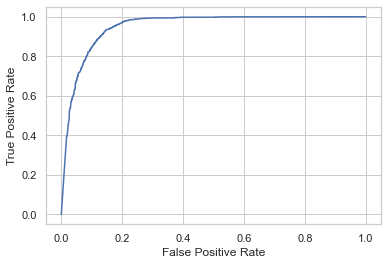

In [213]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 10

# Support Vector Classifier with sigmoid to prevent overfitting on resampled data

In [214]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [215]:
y_pred5=clf.predict(x_train)
y_pred5

array([0., 1., 0., ..., 0., 0., 0.])

In [216]:
ytst_pred5=clf.predict(x_test)
ytst_pred5

array([1., 1., 1., ..., 0., 0., 0.])

In [217]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train,y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.51
Test Score:  0.5
Train Accuracy Score:  0.51
Test Accuracy Score:  0.5
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [218]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred5))
print(confusion_matrix(y_test,ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.51      0.51      0.51      2249
         1.0       0.50      0.50      0.50      2202

    accuracy                           0.50      4451
   macro avg       0.50      0.50      0.50      4451
weighted avg       0.50      0.50      0.50      4451

[[1147 1102]
 [1103 1099]]


In [219]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is turned off for model development.')

Graph cannot be generated because probability is turned off for model development.


# Successful Model is saved in pickle for production

# Conclusion
There is 1 successful mode with right fit The model daisplays Low Variance And Low Biance with good accuracy scores.

Model 8: RFC With Grid Search CV On Resampled Data

Train Score:  1.0

Test Score:  0.99

Train Accuracy Score:  1.0

Test Accuracy Score:  0.99

              precision    recall  f1-score   support

           0       1.00      0.97      0.99       111
           1       0.97      1.00      0.99       110

    accuracy                           0.99       221
   macro avg       0.99      0.99      0.99       221
weighted avg       0.99      0.99      0.99       221

[[108   3]
 [  0 110]]
 
 Please note, metrics calculation is explained above while development and evaluation.

# Credits:
DataTrained and Python Documentations.